In [434]:
import dask.dataframe as dd
import pandas as pd
import hvplot.dask

restaurant_data = dd.read_csv('normal_bills.csv', dtype={"concept": "string[pyarrow]"})
restaurant_data["business_date"] = dd.to_datetime(restaurant_data["business_date"])
restaurant_data = restaurant_data.sort_values(by='business_date')


In [435]:
restaurant_data.head()

,bill_paid_at_local,bill_total_billed,bill_total_discount_item_level,bill_total_gratuity,bill_total_net,bill_total_tax,bill_total_voided,business_date,order_duration_seconds,order_seated_at_local,order_closed_at_local,order_take_out_type_label,payment_amount,payment_count,payment_total_tip,sales_revenue_with_tax,concept,city,country
10532,2024-07-01 18:32:39,73.50,0.0,0.00,70.00,3.50,24.000,2024-07-01,8876,2024-07-01 16:04:43,2024-07-01 18:32:39,dinein,89.67,1,16.17,73.50,BAR,Calgary,CA
112252,2024-07-01 12:59:02,3.33,0.0,0.00,3.00,0.38,16.250,2024-07-01,47,2024-07-01 12:58:15,2024-07-01 12:59:02,dinein,3.62,1,0.00,3.33,BAR,Vancouver,CA
58603,2024-07-01 22:11:06,59.86,0.0,1.78,54.85,5.01,22.990,2024-07-01,3961,2024-07-01 21:05:05,2024-07-01 22:11:06,dinein,72.74,1,11.10,59.86,FINE_DINING,Fort Walton Beach,US
46848,2024-07-02 04:05:57,96.56,0.0,0.00,85.45,11.11,17.082,2024-07-01,38460,2024-07-01 17:24:57,2024-07-02 04:05:57,dinein,96.56,1,0.00,96.56,FAMILY_DINING,Ottawa,CA
46847,2024-07-01 19:01:28,23.72,0.0,0.00,20.99,2.73,7.990,2024-07-01,3879,2024-07-01 17:56:49,2024-07-01 19:01:28,dinein,27.99,1,4.27,23.72,FAMILY_DINING,Ottawa,CA


# External data cleaning and transformation

### Provincial data

We will mostly be working on Canadian data, so we are interested in the provincial data

We can find how the effects vary from province to province by merge the cities and province from an external dataset (from [here](https://simplemaps.com/data/canada-cities))

In [436]:
city_data = dd.read_csv('canadacities.csv', dtype={'population': 'float64'})
new_restaurant_data = restaurant_data.merge(city_data[['city_ascii', 'province_name']], 
                          left_on='city', 
                          right_on='city_ascii', 
                          how="left").drop('city_ascii',axis=1)

In [437]:
new_restaurant_data.head()

,bill_paid_at_local,bill_total_billed,bill_total_discount_item_level,bill_total_gratuity,bill_total_net,bill_total_tax,bill_total_voided,business_date,order_duration_seconds,order_seated_at_local,order_closed_at_local,order_take_out_type_label,payment_amount,payment_count,payment_total_tip,sales_revenue_with_tax,concept,city,country,province_name
0,2024-07-01 18:32:39,73.50,0.0,0.00,70.00,3.50,24.000,2024-07-01,8876,2024-07-01 16:04:43,2024-07-01 18:32:39,dinein,89.67,1,16.17,73.50,BAR,Calgary,CA,Alberta
1,2024-07-01 12:59:02,3.33,0.0,0.00,3.00,0.38,16.250,2024-07-01,47,2024-07-01 12:58:15,2024-07-01 12:59:02,dinein,3.62,1,0.00,3.33,BAR,Vancouver,CA,British Columbia
2,2024-07-01 22:11:06,59.86,0.0,1.78,54.85,5.01,22.990,2024-07-01,3961,2024-07-01 21:05:05,2024-07-01 22:11:06,dinein,72.74,1,11.10,59.86,FINE_DINING,Fort Walton Beach,US,<NA>
3,2024-07-02 04:05:57,96.56,0.0,0.00,85.45,11.11,17.082,2024-07-01,38460,2024-07-01 17:24:57,2024-07-02 04:05:57,dinein,96.56,1,0.00,96.56,FAMILY_DINING,Ottawa,CA,Ontario
4,2024-07-01 19:01:28,23.72,0.0,0.00,20.99,2.73,7.990,2024-07-01,3879,2024-07-01 17:56:49,2024-07-01 19:01:28,dinein,27.99,1,4.27,23.72,FAMILY_DINING,Ottawa,CA,Ontario


In [438]:
canadian_restaurant_data = new_restaurant_data[new_restaurant_data['country']=='CA']
# The city dataset only has data on cities with a population greater or equal to 100,000
canadian_restaurant_data = canadian_restaurant_data.dropna(subset=['province_name'])

In [439]:
canadian_restaurant_data.hvplot.scatter(x='business_date',y='sales_revenue_with_tax')

:Scatter   [business_date]   (sales_revenue_with_tax)

In [440]:
canadian_restaurant_data.hvplot.scatter(x='business_date',y='bill_total_net')

:Scatter   [business_date]   (bill_total_net)

### CPI data

I now look at it compared to the Consumer Price Index (not deseasonalized) with its base set relative to 2002, taken from [here](https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=1810000401&pickMembers%5B0%5D=1.2&cubeTimeFrame.startMonth=06&cubeTimeFrame.startYear=2024&cubeTimeFrame.endMonth=01&cubeTimeFrame.endYear=2025&referencePeriods=20240601%2C20250101).
Note: CPI data is the price levels of a basket of goods and services at a *single point in time*, namely at the end of each month, which means that CPI is a **stock** variable. This means that when matching to a date-time format that includes days, we match the CPI data to be on the last day of the month.

The monthly inflation rate can be calculated from the monthly CPI ($\text{inflation rate}=\frac{\text{current month CPI}-\text{last month CPI}}{\text{last month CPI}}$), and since it's a rate, it is a **flow** variable. This means when matching to a date-time format with days, we have it be the average day (i.e. if month has 30/31 days, the inflation rate's "day" = 15)

Note: The official inflation rate seen on government websites typically use Year-Over-Year inflation rate (i.e. rather than comparing Nov2024 to Dec 2024, they compare Dec2023 to Dec2024). This is useful for looking at inflation long-term, but less so when looking on a short monthly basis.

In [441]:
cpi_raw = dd.read_csv('cpi.csv')

cpi_raw.compute()

,Products and product groups,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11,2020-12,2021-01,...,2024-04,2024-05,2024-06,2024-07,2024-08,2024-09,2024-10,2024-11,2024-12,2025-01
0,All-items,136.1,137.2,137.2,137.0,136.9,137.5,137.7,137.4,138.2,...,160.6,161.5,161.4,162.1,161.8,161.1,161.8,161.8,161.2,161.3
1,Food,154.3,154.8,155.0,153.8,152.6,153.3,153.9,153.6,155.0,...,187.4,189.0,190.0,190.5,190.3,190.3,190.5,191.5,188.0,187.0
2,Transportation,139.7,142.8,142.8,141.5,140.4,141.1,141.3,142.3,144.9,...,173.8,173.9,173.6,175.9,173.5,169.3,169.9,170.4,173.4,173.1
3,Gasoline,132.8,146.7,153.1,151.9,151.3,149.0,146.8,151.7,160.9,...,246.3,243.2,235.7,241.4,235.2,218.4,220.0,220.1,218.7,227.4
4,"Alcoholic beverages, tobacco products and recr...",172.1,172.2,172.0,171.8,172.1,172.5,172.1,171.4,172.5,...,195.9,196.4,196.5,196.4,197.9,197.8,198.0,198.3,193.5,192.3
5,All-items excluding food,132.7,133.8,133.9,133.8,133.9,134.4,134.6,134.3,135.1,...,155.7,156.5,156.1,157.0,156.6,155.8,156.6,156.4,156.3,156.6
6,All-items excluding food and energy,131.5,132.1,131.9,131.9,131.9,132.5,132.7,132.2,132.8,...,150.5,151.4,151.4,152.0,151.8,151.7,152.4,152.2,152.1,152.0
7,"All-items excluding alcoholic beverages, tobac...",135.0,136.0,136.1,135.9,135.8,136.3,136.6,136.3,137.1,...,159.5,160.4,160.2,161.1,160.6,160.0,160.7,160.7,160.2,160.3
8,All-items excluding energy,135.5,136.1,136.0,135.7,135.6,136.2,136.5,136.0,136.7,...,156.6,157.7,157.8,158.5,158.3,158.1,158.8,158.8,158.2,157.9
9,All-items excluding gasoline,135.8,136.5,136.4,136.2,136.1,136.7,137.0,136.6,137.2,...,157.7,158.8,158.8,159.4,159.2,159.1,159.7,159.7,159.1,159.0


In [442]:
def columnify_monthly_times_series_table(category_group_name: str, value_name: str):
    # Turn into row format s.t. Months are under 'Date' column and CPI values are under 'CPI' column
    ## Recall that we want to backfill i.e. set CPI "day" = last day since it's a stock variable, hence we offset to MonthEnd
    melted_cpi = cpi_raw.melt(id_vars=[category_group_name], var_name='Month', value_name=value_name).assign(Month=lambda x: pd.to_datetime(x['Month']) + pd.offsets.MonthEnd(0))
    ## Need to let Dask know what the categories are so it doesn't get fussy
    melted_cpi[category_group_name] = melted_cpi[category_group_name].astype('category')
    melted_cpi[category_group_name] = melted_cpi[category_group_name].cat.set_categories(
        melted_cpi[category_group_name].unique()
    )
    # Turn 'Products and product groups' into columns
    pivoted_cpi = melted_cpi.pivot_table(index='Month', columns=category_group_name, values=value_name)
    return pivoted_cpi

pivoted_cpi = columnify_monthly_times_series_table('Products and product groups', 'Canadian CPI')
pivoted_cpi.compute()

Products and product groups,All-items,Food,Transportation,Gasoline,"Alcoholic beverages, tobacco products and recreational cannabis",All-items excluding food,All-items excluding food and energy,"All-items excluding alcoholic beverages, tobacco products and smokers' supplies and recreational cannabis",All-items excluding energy,All-items excluding gasoline,Private transportation excluding gasoline,Food and energy,Fresh fruit and vegetables,Energy
Month,,,,,,,,,,,,,,
2020-05-31,136.1,154.3,139.7,132.8,172.1,132.7,131.5,135.0,135.5,135.8,132.9,149.5,148.2,137.0
2020-06-30,137.2,154.8,142.8,146.7,172.2,133.8,132.1,136.0,136.1,136.5,133.8,152.4,152.5,146.2
2020-07-31,137.2,155.0,142.8,153.1,172.0,133.9,131.9,136.1,136.0,136.4,133.1,153.6,155.6,149.7
2020-08-31,137.0,153.8,141.5,151.9,171.8,133.8,131.9,135.9,135.7,136.2,132.4,152.5,150.7,149.3
2020-09-30,136.9,152.6,140.4,151.3,172.1,133.9,131.9,135.8,135.6,136.1,132.0,151.8,145.9,149.8
2020-10-31,137.5,153.3,141.1,149.0,172.5,134.4,132.5,136.3,136.2,136.7,133.3,152.2,148.3,149.4
2020-11-30,137.7,153.9,141.3,146.8,172.1,134.6,132.7,136.6,136.5,137.0,133.7,152.5,150.0,149.1
2020-12-31,137.4,153.6,142.3,151.7,171.4,134.3,132.2,136.3,136.0,136.6,133.2,153.2,150.4,152.0
2021-01-31,138.2,155.0,144.9,160.9,172.5,135.1,132.8,137.1,136.7,137.2,135.5,154.8,154.3,154.3


### Deseasonalize CPI

Typically with time series data, it consists of 4 components: **Trend, Cyclical, Seasonal, Irregular**.

We're interested in the underlying trend of the CPI, so we need to seperate it by **seasonal decomposition** (A.K.A "deseasonalize" or "seasonally adjust").

We choose to deseasonalize via STL decomposition as it is more resistant to irregular spikes, which is useful here since our data includes data during COVID (2020-2022), which was a **really** unusual time

In [443]:
from statsmodels.tsa.seasonal import STL
import numpy as np



def apply_seasonal_adjust(seasonal_cpi):
    deseasonalized_cpi = seasonal_cpi.copy()
    log_pivoted_cpi = np.log(seasonal_cpi.compute())
    
    for column in deseasonalized_cpi.columns:
        series = log_pivoted_cpi[column]
        # Apply STL with period=12 (for monthly data) to capture all the seasons in a year
        stl = STL(series, period=12)
        result = stl.fit()

        deseasonalized_cpi[column] = np.exp(series - result.seasonal)
    return deseasonalized_cpi

deseasonalized_cpi = apply_seasonal_adjust(pivoted_cpi)
deseasonalized_cpi.head()

Products and product groups,All-items,Food,Transportation,Gasoline,"Alcoholic beverages, tobacco products and recreational cannabis",All-items excluding food,All-items excluding food and energy,"All-items excluding alcoholic beverages, tobacco products and smokers' supplies and recreational cannabis",All-items excluding energy,All-items excluding gasoline,Private transportation excluding gasoline,Food and energy,Fresh fruit and vegetables,Energy
Month,,,,,,,,,,,,,,
2020-05-31,135.412434,152.956010,138.396820,133.058819,170.967631,132.104282,130.945370,134.275480,134.819408,135.142488,132.171969,148.385678,150.493685,137.186500
2020-06-30,136.057466,153.553063,140.084516,139.523397,171.205163,132.734459,131.281125,134.898910,135.232117,135.606747,132.817775,150.079240,152.070192,141.738801
2020-07-31,136.357970,153.804424,141.045182,144.813169,171.660614,133.101009,131.392886,135.247942,135.356919,135.787185,132.773331,151.309416,153.023680,145.085640
2020-08-31,136.809571,153.725633,141.401605,149.870540,171.578536,133.575008,131.666326,135.701328,135.545280,136.011761,132.847499,152.281825,151.842001,148.607332
2020-09-30,137.178828,153.670968,142.220526,154.005039,172.184782,134.044191,131.886615,136.076013,135.756439,136.265270,133.116976,153.148233,151.748830,151.668956


Let's make sure that our seasonal adjustment worked out fine (it worked if it's a less noisy version of the original not seasonally adjusted CPI)

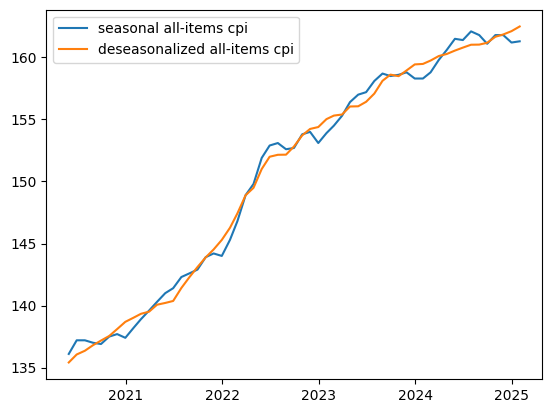

In [444]:
import matplotlib.pyplot as plt

pd_pivoted_cpi = pivoted_cpi.compute()
pd_deseasonalized_cpi = deseasonalized_cpi.compute()

x = pd_pivoted_cpi.index
x_lab = 'Date'
y_lab = 'CPI (base=2002)'

plt.plot(x, pd_pivoted_cpi['All-items'], label='seasonal all-items cpi')
plt.plot(x, pd_deseasonalized_cpi['All-items'], label='deseasonalized all-items cpi')
plt.legend()

In [445]:
# We want it to be in the same timeframe as the daily sales revenue
processed_cpi = deseasonalized_cpi.loc["2024-05":"2025-01"] 

In [446]:
processed_cpi['All-items'].compute()

Month
2024-05-31    160.552074
2024-06-30    160.790489
2024-07-31    161.024053
2024-08-31    161.034177
2024-09-30    161.180640
2024-10-31    161.665788
2024-11-30    161.851697
2024-12-31    162.116544
2025-01-31    162.494813
Name: All-items, dtype: float64

# Analysis of `sales_revenue_with_tax` against All-Items CPI

Well start by first comparing the `All-items` CPI to the `sales_revenue_with_tax` of the restaurant data.
I'll also include the net bill in case I want to analyze the revenue without tax

In [447]:
# Create the monthly CPI time series
def create_CPI_series(CPI_table, column_name) -> pd.core.series.Series:
    raw_column_CPI = CPI_table[column_name].compute()
    column_CPI = raw_column_CPI.squeeze()
    return column_CPI

column_CPIs = {}
column_name_CPIs = list(processed_cpi.columns)
for CPI_name in column_name_CPIs:
    CPI_series = create_CPI_series(processed_cpi, CPI_name)
    column_CPIs[CPI_name] = CPI_series

In [448]:
column_CPIs['All-items']

Month
2024-05-31    160.552074
2024-06-30    160.790489
2024-07-31    161.024053
2024-08-31    161.034177
2024-09-30    161.180640
2024-10-31    161.665788
2024-11-30    161.851697
2024-12-31    162.116544
2025-01-31    162.494813
Name: All-items, dtype: float64

In [449]:
## Set to chronological order first
canadian_restaurant_data = canadian_restaurant_data.sort_values(by="business_date")
canadian_sales = canadian_restaurant_data[['business_date','sales_revenue_with_tax', 'bill_total_net', 'province_name']]
## Set as index as we'll be using it to work with times series data
canadian_sales = canadian_sales.set_index('business_date')
canadian_sales.compute()

,sales_revenue_with_tax,bill_total_net,province_name
business_date,,,
2024-07-01,73.50,70.00,Alberta
2024-07-01,101.85,97.00,Alberta
2024-07-01,127.75,115.00,New Brunswick
2024-07-01,127.75,115.00,Quebec
2024-07-01,127.75,115.00,British Columbia
...,...,...,...
2024-12-31,32.65,32.00,Alberta
2024-12-31,19.26,18.34,Alberta
2024-12-31,56.59,54.48,New Brunswick


In [450]:
canadian_sales.hvplot.scatter(x='business_date', y=['sales_revenue_with_tax', 'bill_total_net'])

:NdOverlay   [Variable]
   :Scatter   [business_date]   (value)

We now plot the data

# Sales vs All CPI

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

x = canadian_sales.index
x_label = 'Date'
y1 = canadian_sales['sales_revenue_with_tax']
y1_label = 'Sales Revenue ($)'
all_items = column_CPIs['All-items']
y2 = [all_items]
y2_label = ["All items"]
y2_axis_label = "CPI (base=2002)"

def plot_twin_time_series(x, x_label: str, y1, y1_label: str, y2: list, y2_label: list, y2_axis_label, title: str):
    '''
    where both y1 and y2 are based on date (daily), where y2 is a list of Series
    '''
    # Create figure and first axis
    fig, ax1 = plt.subplots(figsize=(10, 6))
    
    # Plot the sales data as a scatter plot on ax1
    ax1.fill_between(x, y1, color='g', label=y1_label, alpha=0.5)
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y1_label, color='g')
    ax1.tick_params(axis='y', labelcolor='g')


    colormap = plt.colormaps.get_cmap("tab20")  # A colormap with 20 distinct colors (you can choose other colormaps)
    
    # Create the second y-axis
    ax2 = ax1.twinx()
    
    # Plot the CPI data as a line plot on ax2
    for idx, cpi_series in enumerate(y2):
        ax2.plot(y2[idx].index, y2[idx], label=y2_label[idx], color=colormap(idx))
    ax2.set_ylabel(y2_axis_label)
    ax2.tick_params(axis='y')
    ax2.legend()
    
    # Title and layout adjustments
    fig.suptitle(title)

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, "Sales Revenue and CPI Over Time")

# Show the plot
plt.show()


As you can see, the sales data is very something you can't see, although you can notice that most of the revenue is under $200.

However, that's not what we're looking for, we want the overall trend, also it's still hard to look at, so we'll apply some smoothing to it

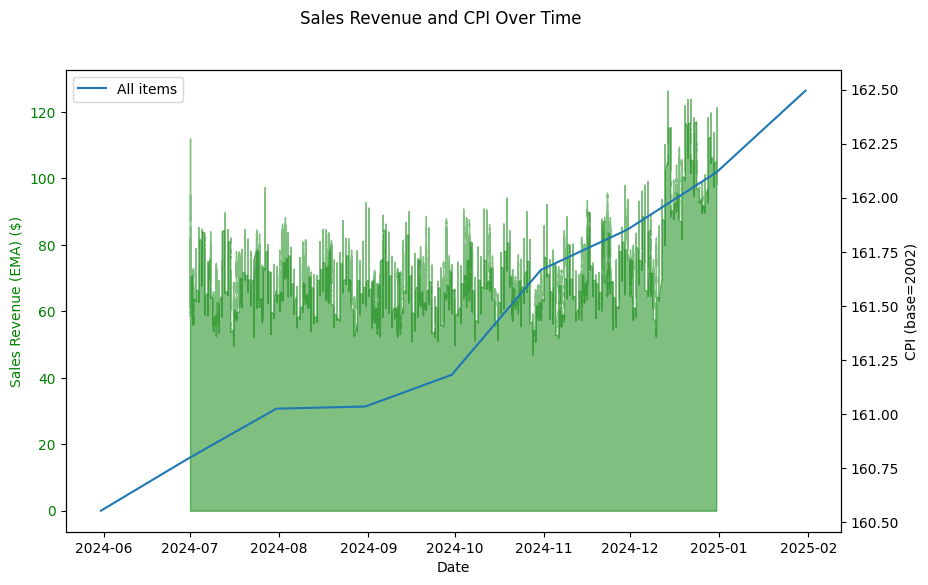

In [452]:
# sales_rolling = canadian_sales['sales_revenue_with_tax'].rolling(window=7, center=True).mean().compute()
# sales_rolling = canadian_sales['sales_revenue_with_tax'].rolling(window=15, center=True).mean().compute()
# sales_rolling = canadian_sales['sales_revenue_with_tax'].rolling(window=15, center=True).mean().compute()

## Still too spiky using Rolling Moving Avg, we try using Exponential Moving Avg, which may work better as it emphasizes the recent peaks more definitively
def ema(series):
    return series.ewm(alpha=0.01).mean()
sales_ema = ema(canadian_sales['sales_revenue_with_tax'].compute())


y1 = sales_ema
y1_label = 'Sales Revenue (EMA) ($)'
title = "Sales Revenue and CPI Over Time"

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)


This here is much more visible. For much of the graph, the CPI and sales revenue are not related at all until the end of December, where they are directly positively correlated.

Sales revenue is inherently seasonal, as for e.g. during December, everybody would want to eat out during the winter holiday.
Due to this, we would typically want to deseasonalize it so we can see the trends and cycles better. *The issue* is that we have less than a year's worth of data, and deseasonalizing requires the dataset to encompass all of the seasons atleast 3-5 years (since our goal is to look at the overall trend)*, and might explain why there's a huge spike in December.


**However**, since we deseasonalized the CPI, this means that even though the price of goods & services are increasing, the sales revenue was relatively resistant, with it even increasing in December! How much of that is due to the winter holidays is a mystery though.

##### Let's see if there's any difference without tax

#### Net bill vs All CPI

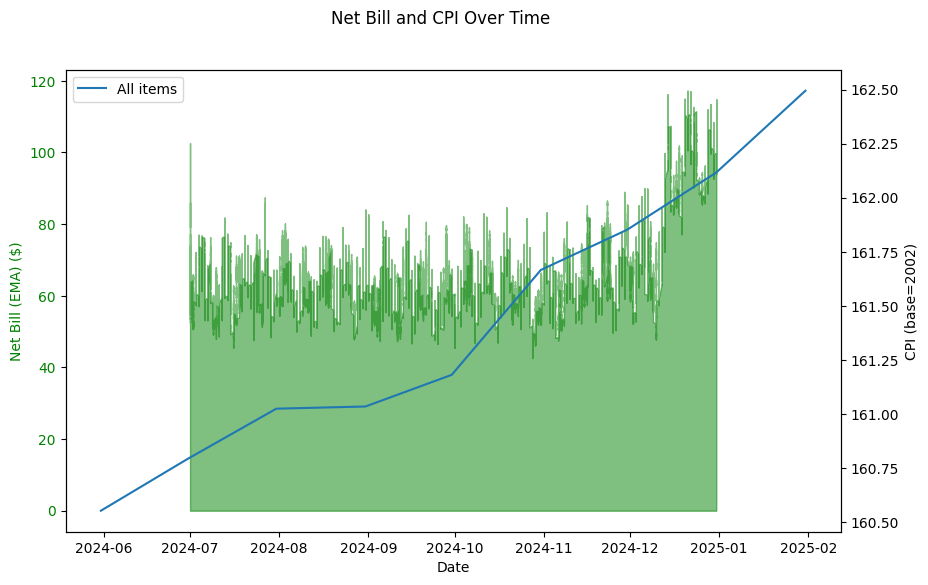

In [453]:
net_bill_ema = canadian_sales['bill_total_net'].compute().ewm(alpha=0.01).mean()
y1 = net_bill_ema
y1_label = 'Net Bill (EMA) ($)'
title = "Net Bill and CPI Over Time"

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

As you can see, there is virtually no difference with or without tax.

## Provincial Sales vs All CPI
We now compare how well the sales did in restaurants from province to province

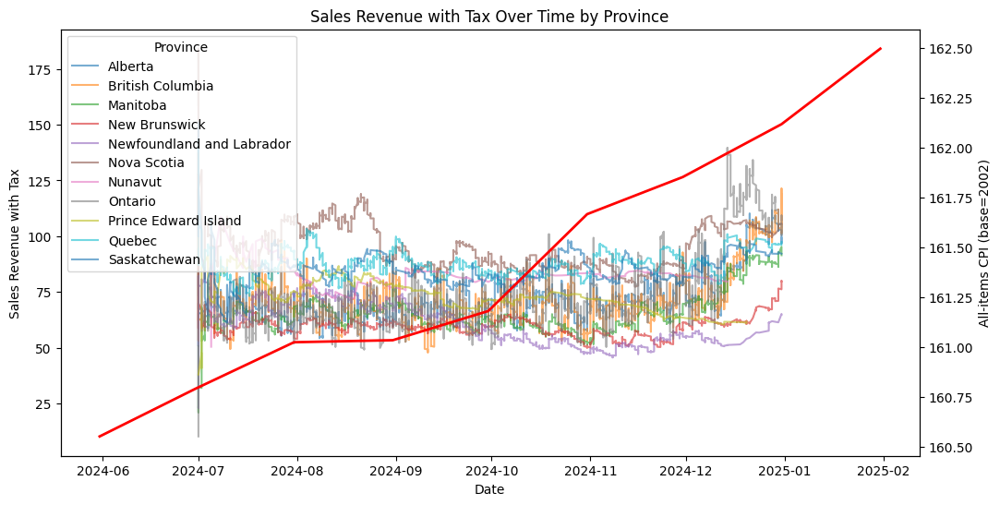

In [471]:
canadian_sales_pd = canadian_sales.compute()

def plotting_provinces(series_dataframe, series_col_name: str, series_label: str, cpi_series, cpi_series_label: str, title: str):
    fig, ax1 = plt.subplots(figsize=(12, 6))
    
    # Loop through each province and plot its line graph while smoothing it
    for province, group in series_dataframe.groupby("province_name"):
        # plt.plot(canadian_sales_pd.index, group["sales_revenue_with_tax"], label=province, linewidth=2)
        ax1.plot(group.index, ema(group[series_col_name]), label=province, alpha=0.6)  # Fill the area under the curve
    ax1.set_xlabel("Date")
    ax1.set_ylabel(series_label)

    # Setting secondary axis for CPI
    ax2 = ax1.twinx()
    ax2.plot(cpi_series.index, cpi_series, label=cpi_series_label, color='r', linewidth=2)  # Assuming CPI data has 'CPI' column
    ax2.set_ylabel((cpi_series_label + " (base=2002)"))
    
    plt.title(title)

    plt.xticks(rotation=45)
    ax1.legend(title="Province")

y1 = 'sales_revenue_with_tax'
y1_lab = 'Sales Revenue with Tax'
y2 = all_items
y2_lab = "All-items CPI"
title = "Sales Revenue with Tax Over Time by Province"
plotting_provinces(canadian_sales_pd, y1, y1_lab, y2, y2_lab, title)

This is really messy to look at, so lets group into Eastern, Central, and Western Canada

In [511]:
# Added Nunavut to Central Canada since it was the only northern Canada region
central_canada = ['Ontario','Quebec','Nunavut']
eastern_canada = ['Newfoundland and Labrador', 'Nova Scotia', 'New Brunswick', 'Prince Edward Island']
western_canada = ['Manitoba', 'Saskatchewan', 'Alberta', 'British Columbia']


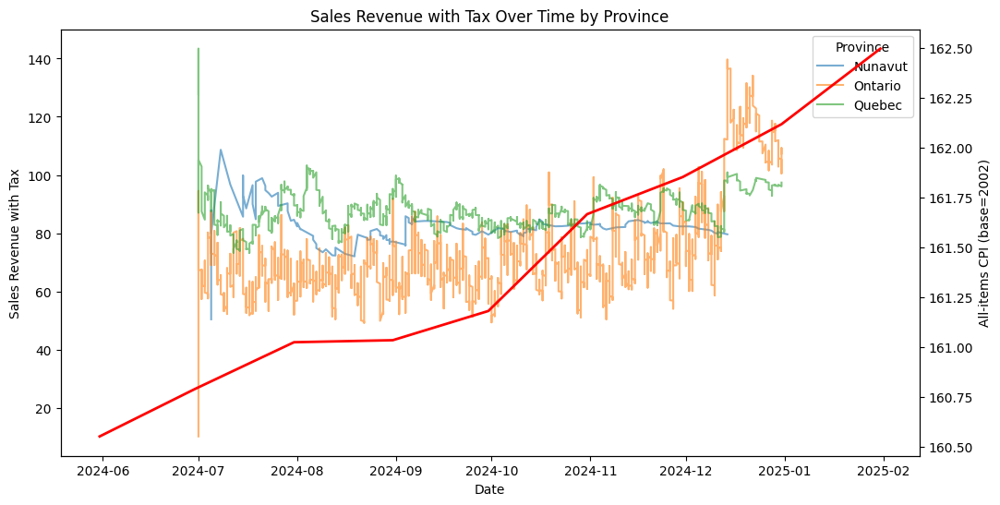

In [512]:
central_canada_sales = canadian_sales[canadian_sales['province_name'].isin(central_canada)]
pd_central_canada_sales = central_canada_sales.compute()

plotting_provinces(pd_central_canada_sales, y1, y1_lab, y2, y2_lab, title)

# grouped = central_canada_sales.groupby("province_name")
# ontario_sales = grouped.get_group(("Ontario",)).compute()
# plt.plot(ontario_sales.index, ema(ontario_sales['sales_revenue_with_tax']))

In Central Canada (+ Nunavut), Quebec restaurants seem to not be doing as well Ontario restaurants, with its sales revenue mostly being stagnant; despite there being the holidays AND a tax break. Even Nunavut has more growth than Quebec!

This isn't very good considering that monthly price index (i.e. inflation) is steadily increasing by 0.25-0.5 basis points each month.

On the other hand, the Ontario restaurants appear to be stable before greatly increasing in December, which shows how they increased heavily in revenue during the holidays (whether the reason be the winter holiday tax break, winter break, or genuine growth).

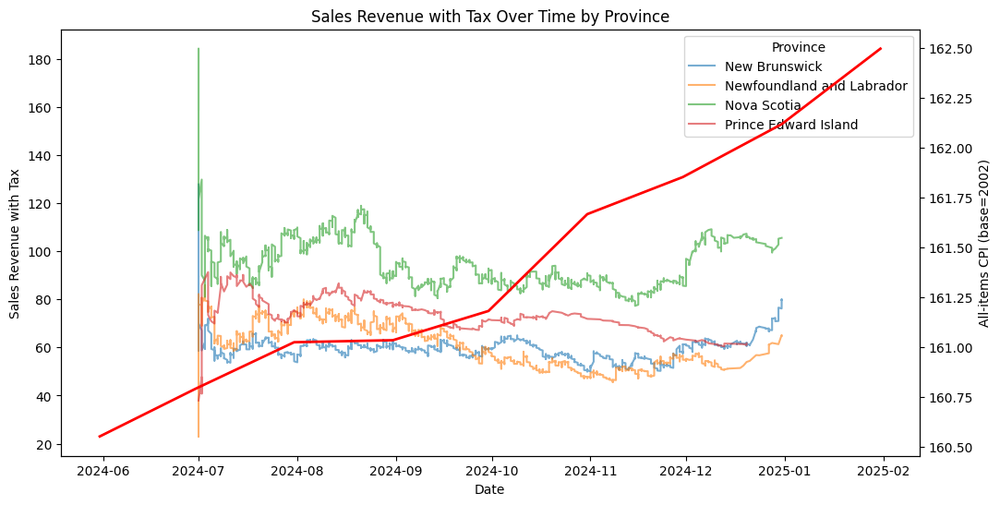

In [513]:
eastern_canada_sales = canadian_sales[canadian_sales['province_name'].isin(eastern_canada)]
pd_eastern_canada_sales = eastern_canada_sales.compute()

plotting_provinces(pd_eastern_canada_sales, y1, y1_lab, y2, y2_lab, title)

In Eastern Canada, all of the restaurants here are heavily affected by inflation, with a very noticeable negative correlation with the All Items price index.

This can be seen from July 2024 to September 2024 where they were relatively high before falling down when inflation began to rise from September 2024 to December 2024, when they began to slightly rise again; possibly due to the winter tax break *(I think you see a pattern, it's pretty hard to attribute this increase to it being due to the holidays vs winter tax break vs genuine increase in sales due to how this tax break is an anomaly).*

The best performing province here appears to be Nova Scotia.

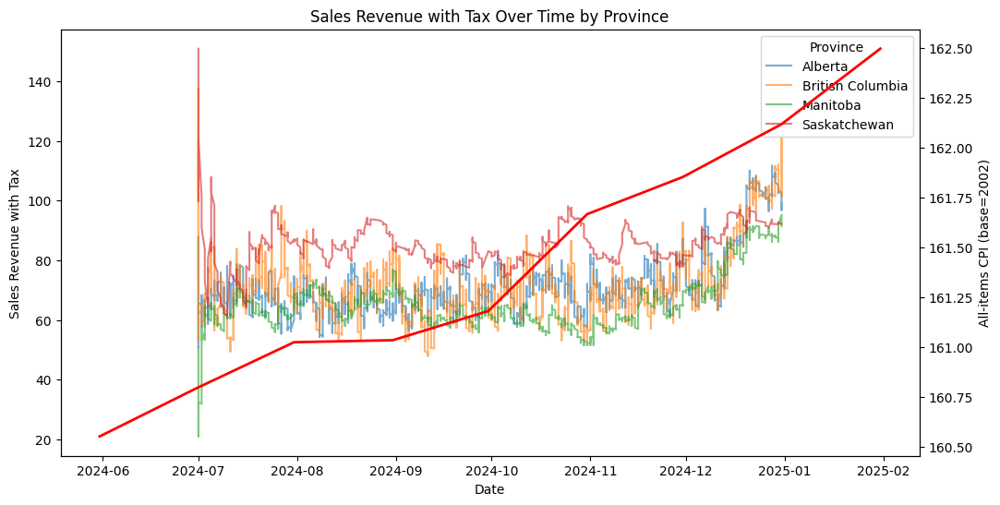

In [514]:
western_canada_sales = canadian_sales[canadian_sales['province_name'].isin(western_canada)]
pd_western_canada_sales = western_canada_sales.compute()

plotting_provinces(pd_western_canada_sales, y1, y1_lab, y2, y2_lab, title)

All of the restaurants in Western Canada appear to be doing well, being pretty resistant to inflation (i.e. no negative correlation with the All-items price index).

Additionally, they also all seem to increase in sales revenue during December, likely due the any of the 3 reasons again (winter tax break, winter holidays, genuine increase)

Interestingly, the strongest province here seemed to be Saskatchewan at first, however in December, it was outclassed by Alberta and British Columbia.

The weakest out of the bunch appears to Manitoba, as it appears to be lightly affected by inflation, considering its little dip right before December:

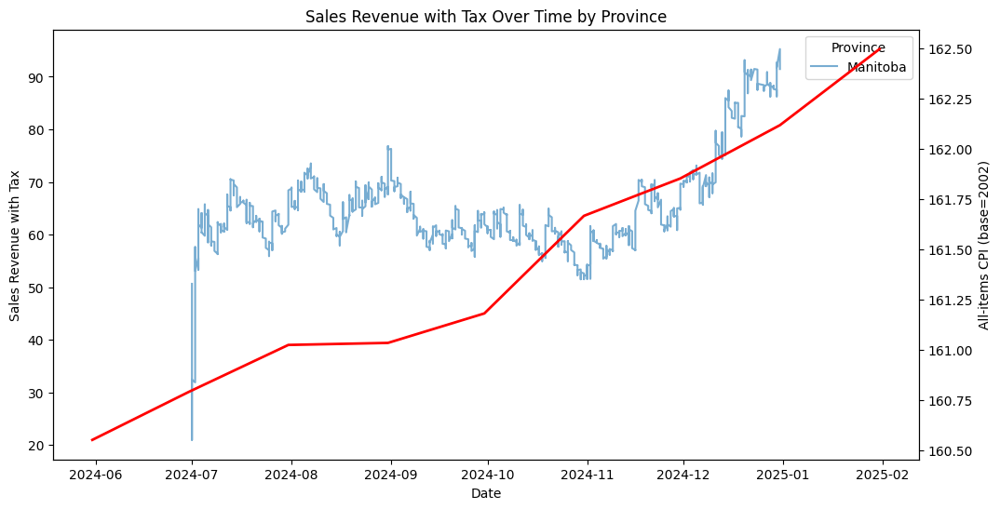

In [516]:
western_canada_sales = canadian_sales[canadian_sales['province_name'].isin(['Manitoba'])]
pd_western_canada_sales = western_canada_sales.compute()

plotting_provinces(pd_western_canada_sales, y1, y1_lab, y2, y2_lab, title)

## Sales vs All CPI Calculations

In [521]:
# Since I made the CPI data to be 2024-05 - 2025-01 in order for it to be more informative
all_items_calc = all_items.iloc[2:-1]

#### Real revenue adjusted for inflation
Let's try to quantify how much of the sales revenue was due to inflation

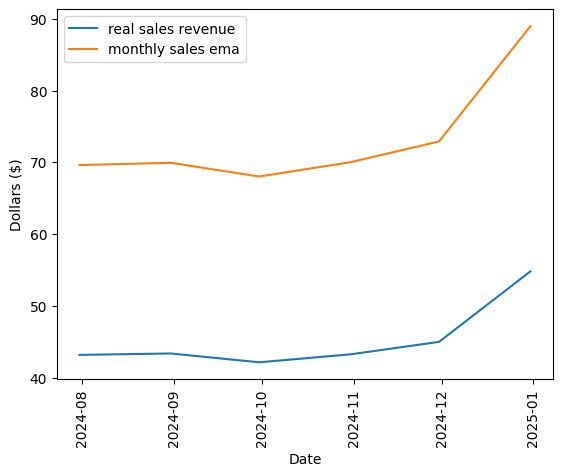

In [522]:
def get_real_value(series: pd.core.series.Series, a_cpi: pd.core.series.Series) -> pd.core.series.Series:
    '''
    Monthifies the times series
    Computes value
    '''
    monthly_series = series.resample('ME').mean()
    reaL_value = monthly_series / a_cpi * 100
    return reaL_value

monthly_sales_ema = monthify_times_series(sales_ema)
monthly_net_bill = monthify_times_series(net_bill_ema)

real_sales_revenue = get_real_value(sales_ema, all_items_calc)
real_net_bill = get_real_value(net_bill_ema, all_items_calc)



x = real_sales_revenue.index
x_lab = 'Date'
y_lab = 'Dollars ($)'

plt.xlabel(x_lab)
plt.ylabel(y_lab)
plt.xticks(rotation=90)
plt.plot(x, real_sales_revenue, label='real sales revenue')
plt.plot(x, monthly_sales_ema, label='monthly sales ema')
plt.legend()

This means for the timeframe this was calculated on, the monthly average of the real sales revenue is more than \\$45, while the nominal (a.k.a value not adjusted for inflation) real sales is about \\$70

More importantly, this means around \\$25 of the sales revenue is due to inflation (base = 2002), which is around 33\% of the monthly sales revenue!

#### Sales Growth vs CPI Growth
Let's quantify how fast sales are growing relative to CPI

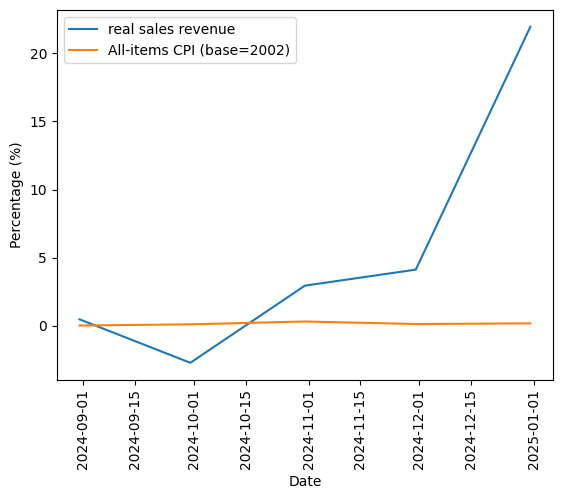

In [593]:
def get_growth(series: pd.core.series.Series) -> pd.core.series.Series:
    '''
    Monthifies the times series
    Computes growth
    '''
    # monthly_series = series.resample('ME').mean()
    # reaL_value = monthly_series / a_cpi * 100
    # reaL_value_adj = reaL_value.iloc[2:-1]
    monthly_series = series.resample('ME').mean()
    growth_rate = monthly_series.pct_change() * 100
    return growth_rate

growth_sales_ema = get_growth(sales_ema)
growth_all_items = get_growth(all_items_calc)

x = all_items_calc.index
x_lab = 'Date'
y_lab = 'Percentage (%)'

plt.xlabel(x_lab)
plt.ylabel(y_lab)
plt.xticks(rotation=90)
plt.plot(x, growth_sales_ema, label='real sales revenue')
plt.plot(x, growth_all_items, label='All-items CPI (base=2002)')
plt.legend()

This means that the sales revenue's growth was negative from september to around the mid-to-end of october, however it sky rocketed in growth starting in December, to more than 20\% by the end of the month!

# Analysis of `sales_revenue_with_tax` against many CPI

We now revisit the other CPI to see if there are any nuances to them compared to the sales revenue

#### Let's instead try with the other CPI data

### Sales vs Food CPI

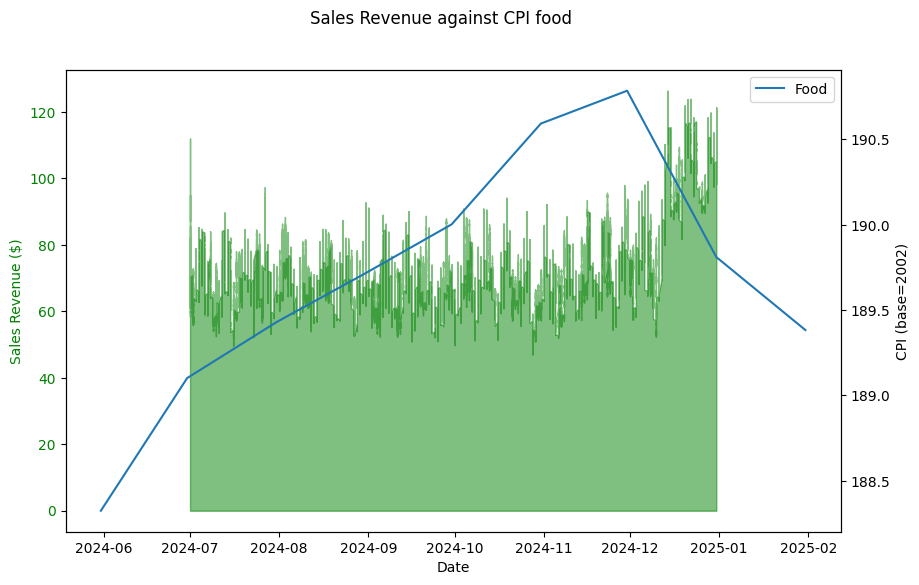

In [533]:
# CPI_excl_food = column_CPIs['All-items excluding food']

x = canadian_sales.index
x_label = 'Date'
y1 = sales_ema
y1_label = 'Sales Revenue ($)'

CPI_food = column_CPIs['Food']
y2 = [CPI_food]
y2_label = ['Food']
y2_axis_label = "CPI (base=2002)"
title = 'Sales Revenue against CPI food'

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

Here, the food CPI doesn't really follow the same trend as sales revenue until 2024-11 where we see a brief spike before massively decreasing in December.

However, much of this can be attributed to the [recent tax break, which largely includes restaurants](https://www.canada.ca/en/department-finance/news/2024/11/more-money-in-your-pocket-a-tax-break-for-all-canadians.html), which is likely what artificially dropped the food prices, and caused the large increase in sales revenue.

Comparing this to the CPI of all items, this means that tax breaks like these greatly boost restaurants sales even when inflation is increasing.

Let's now turn our attention towards the price index of Fresh fruit and vegetables

### Sales vs Fresh Fruits and Vegetables CPI

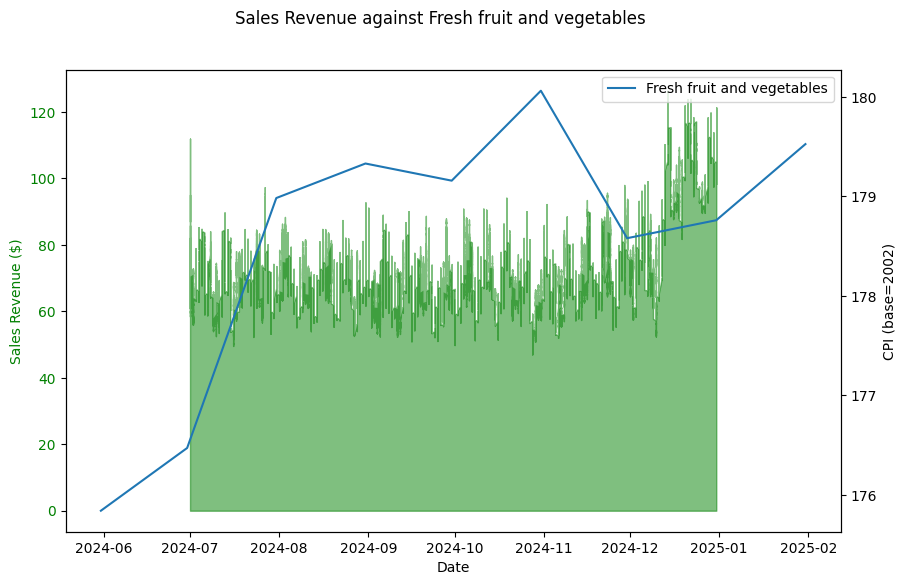

In [534]:
# CPI_excl_food = column_CPIs['All-items excluding food']
CPI_fresh = column_CPIs['Fresh fruit and vegetables']
y2 = [CPI_fresh]
y2_label = ['Fresh fruit and vegetables']
title = 'Sales Revenue against Fresh fruit and vegetables'

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

Again, sales revenue appears to be resistant against the price, despite its wacky volatile movements beginning in 2024-10. 
However, this time, it's relatively unresponsive to the 

When we look at [what's included in the dataset](https://www150.statcan.gc.ca/n1/pub/62f0014m/62f0014m2023003-eng.htm), we can briefly see that 
fruits consists of Apples, Oranges, Bananas, Citrus *(exluding Oranges)*, Grapes, Berries *(including cherries)*, and Others; while
vegetables consits of Potatoes, Tomatoes, Lettuce, Carrots, Onions, Peppers, Cucumber, Mushrooms.

The immediate reason for this difference is again, due to the [recent tax break, which doesn't include fresh produce such as fresh fruits and vegetables](https://www.canada.ca/en/department-finance/news/2024/11/more-money-in-your-pocket-a-tax-break-for-all-canadians.html). 


#### In order to get to these restaurants, you would need to use transportation, so let's view their price indexes

### Sales vs Transportations CPI

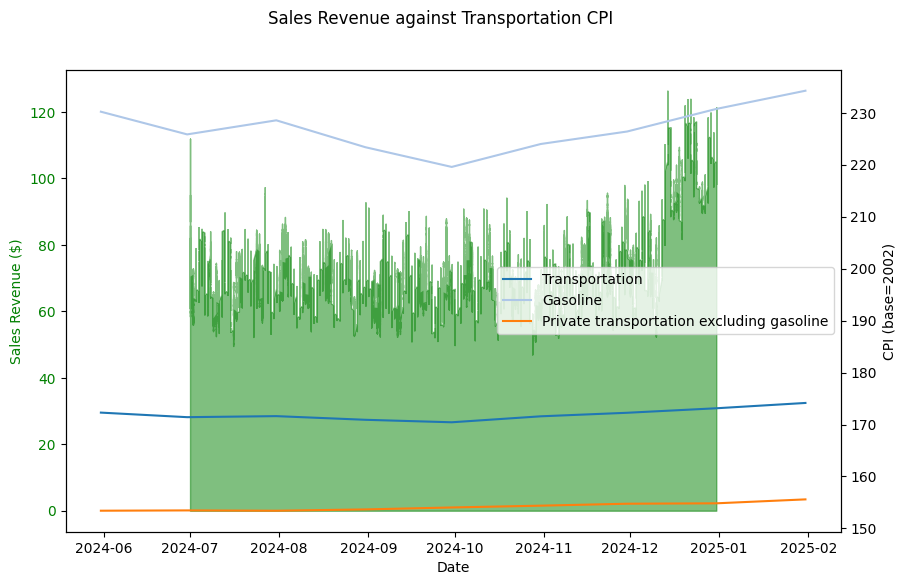

In [535]:
CPI_Transportation = column_CPIs['Transportation']
CPI_Gasoline = column_CPIs['Gasoline']
CPI_Private_Transportation = column_CPIs['Private transportation excluding gasoline']
y2 = [CPI_Transportation, CPI_Gasoline, CPI_Private_Transportation]
y2_label = ['Transportation','Gasoline', 'Private transportation excluding gasoline']
title = 'Sales Revenue against Transportation CPI'

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

Here, we can see that the gasoline price index closely follows the sales revenue, with it increasing it in December more than usual; despite it being deseasonalized. This, again, can be attributed to the recent winter holiday tax break, which encouraged people to go out to eat at restaurants for that sweet *no tax*.

Although slight, we can see the privation transportation and [transportation CPI](https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=1810000407) price indexes also following along with the sales revenue.

This is surprising since private transportation like cars are typically what's used to drive to get to the restaurant; either that or that we walk. This is because in Canada, most places are car centric due to how wide and sparse Canada is, with only dense cities such as Toronto or British Columbia, Vancouver being more favouring towards public transit.

##### Let's look more in-depth at this by looking at the price indices of Transportation and Privation Transportation.

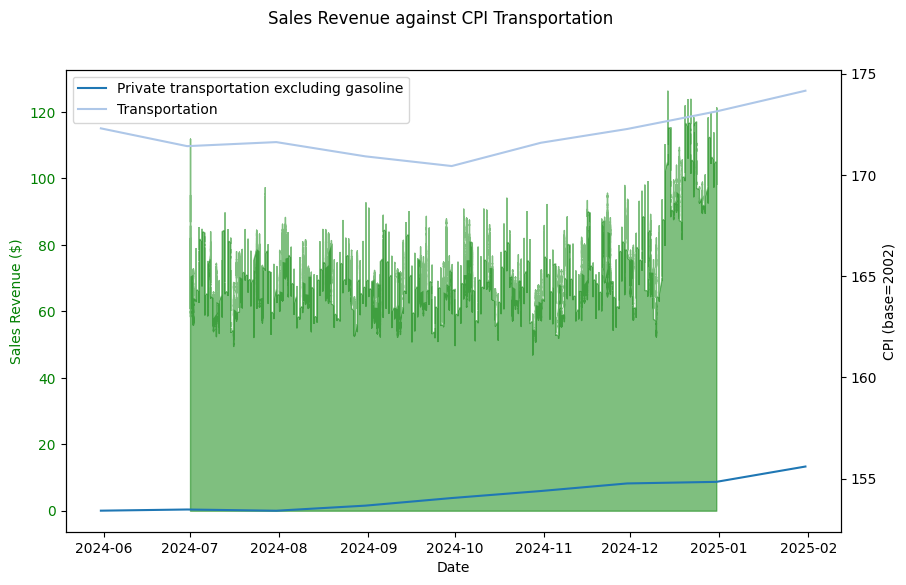

In [536]:
y2 = [CPI_Private_Transportation, CPI_Transportation]
y2_label = ['Private transportation excluding gasoline', 'Transportation']
title = 'Sales Revenue against CPI Transportation'
plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

As seen here, they both slowly increase.

However, [taking another look at what's included in the transportation price index](https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=1810000407), it's pretty clear it doesn't just include public transportation 😅.

##### Lets go back to comparing against the other price indexes, this time including against Energy

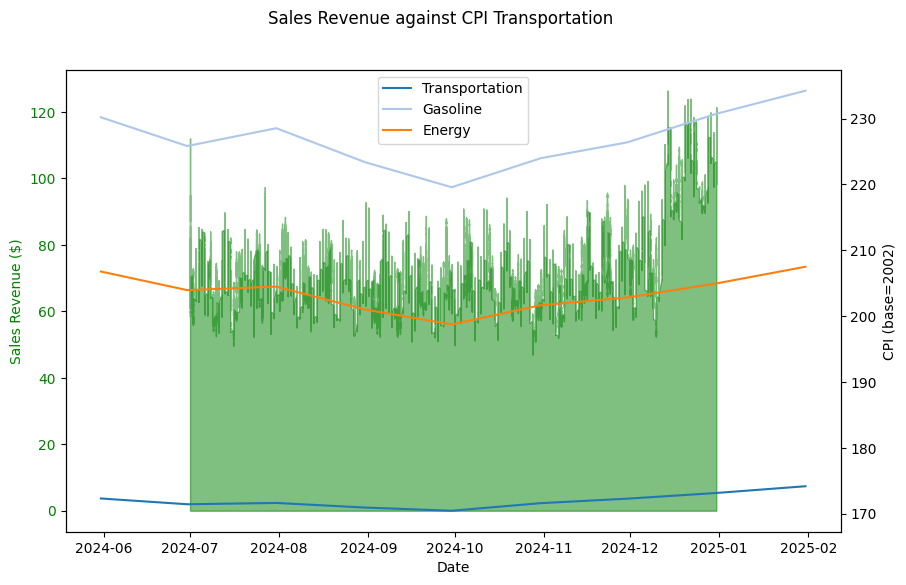

In [537]:
CPI_Energy = column_CPIs['Energy']
y2 = [CPI_Transportation, CPI_Gasoline, CPI_Energy]
y2_label = ['Transportation', 'Gasoline', 'Energy']

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

Here, the energy price index appears to also be increasing overtime, closely makes sense as gasoline falls under energy.




## Analysis of other metrics against All-items CPI

We now look to compare the other restaurant metrics against the all-items price index

In [529]:
numerical_restaurant_data = canadian_restaurant_data[['bill_total_billed', 'bill_total_discount_item_level', 'bill_total_gratuity', 'bill_total_net', 
                             'bill_total_tax', 'bill_total_voided', 'payment_amount', 'payment_count', 'payment_total_tip', 'sales_revenue_with_tax']]
numerical_restaurant_data
# 'order_take_out_type_label'

,bill_total_billed,bill_total_discount_item_level,bill_total_gratuity,bill_total_net,bill_total_tax,bill_total_voided,payment_amount,payment_count,payment_total_tip,sales_revenue_with_tax
npartitions=1,,,,,,,,,,
,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
,...,...,...,...,...,...,...,...,...,...


`bill_total_billed`, `bill_total_net`, `payment_amount`, and `sales_revenue_with_tax` are all similar enough that they would have the same characteristic/shape/trend, so we ignore them.

In [554]:
# macro_canadian_restaurant_data = canadian_restaurant_data[['business_date', 'sales_revenue_with_tax', 'province_name']]
# canadian_sales.compute()
# # This time, we smoothe the data directly in their dataframe
# for column_name in list(numerical_restaurant_data.columns):
#     names.append()
#     numerical_restaurant_data[column_name] = numerical_restaurant_data[column_name].ewm(alpha=0.01).mean()

# ## Include date
# numerical_restaurant_data = pd.concat([numerical_restaurant_data.compute(), canadian_restaurant_data[['business_date']].compute()], axis=1)


# i.e. data related to bill that adds onto it e.g. tips, gratuity
aux_bills_restaurant_data = numerical_restaurant_data[['bill_total_discount_item_level','bill_total_gratuity','bill_total_tax',
                                                       'bill_total_voided','payment_total_tip','business_date']]
## Ensure it's in chronological order
aux_bills_restaurant_data = aux_bills_restaurant_data.sort_values(by="business_date")
aux_bills_restaurant_data = aux_bills_restaurant_data.set_index('business_date')
aux_bills_restaurant_data

,bill_total_discount_item_level,bill_total_gratuity,bill_total_tax,bill_total_voided,payment_total_tip
business_date,,,,,
2024-07-01,0.000000,0.000000,3.500000,24.000000,16.170000
2024-07-01,1.674751,0.047054,6.774484,17.110083,9.029822
2024-07-01,1.676496,0.046721,6.775098,17.119655,9.043711
2024-07-01,1.678233,0.046386,6.775698,17.129242,9.057665
2024-07-01,1.679960,0.046048,6.776286,17.138845,9.071684
...,...,...,...,...,...
2024-12-31,1.737095,1.522629,4.770799,21.407568,15.053252
2024-12-31,1.738117,1.523506,4.771607,21.391974,15.048444
2024-12-31,1.739147,1.524362,4.772408,21.376515,15.043550


#### Tips vs All-items CPI

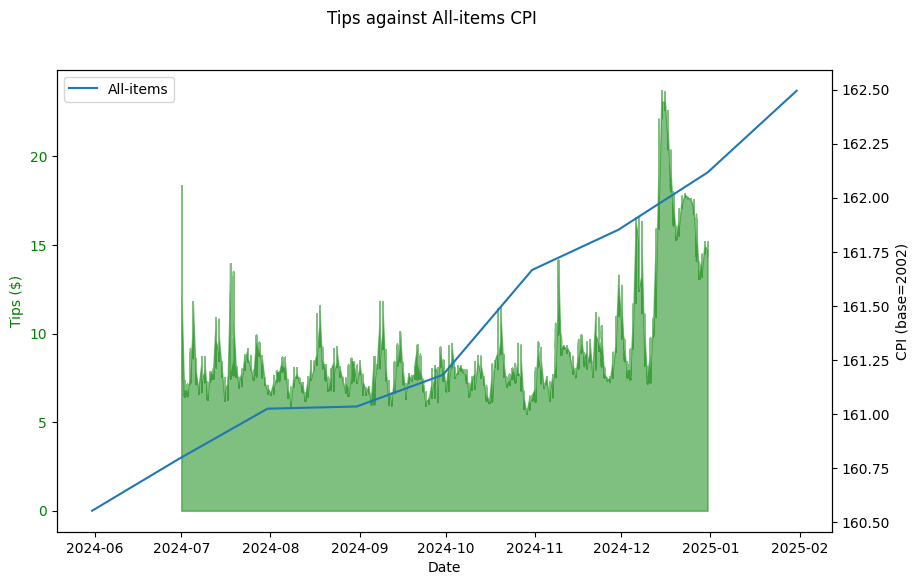

In [570]:
x = aux_bills_restaurant_data.index
x_label = 'Date'

y1 = aux_bills_restaurant_data['payment_total_tip']
y1_label = 'Tips ($)'

y2 = [all_items]
y2_label = ['All-items']
y2_axis_label = "CPI (base=2002)"
title = 'Tips against All-items CPI'

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

It appears to have a similar shape as the sales revenue and other main bill data. Let's try smoothing

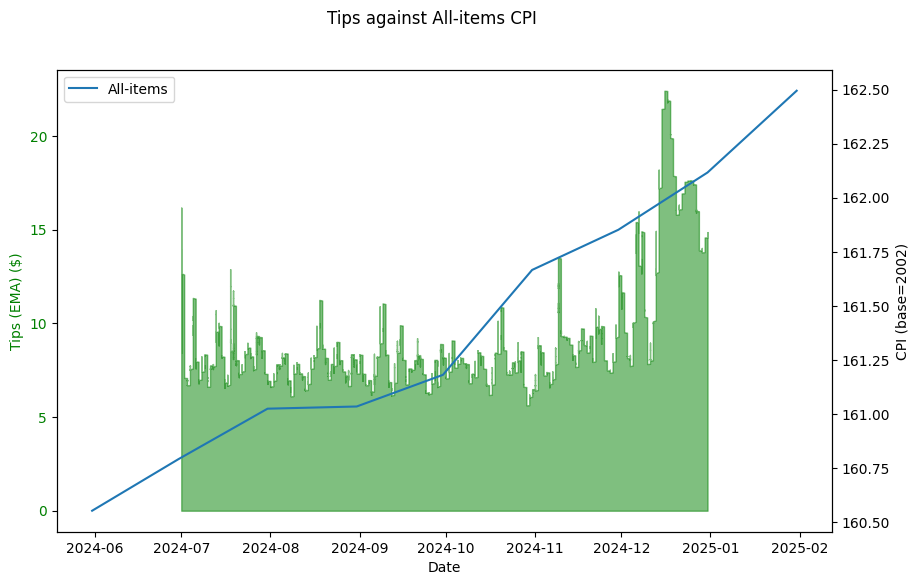

In [571]:
tips_ema = ema(aux_bills_restaurant_data['payment_total_tip'])
y1 = tip_ema
y1_label = 'Tips (EMA) ($)'
plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

Yep, the exact the same thing

##### Now let's try looking at gratuity

#### Gratuity vs All-items CPI

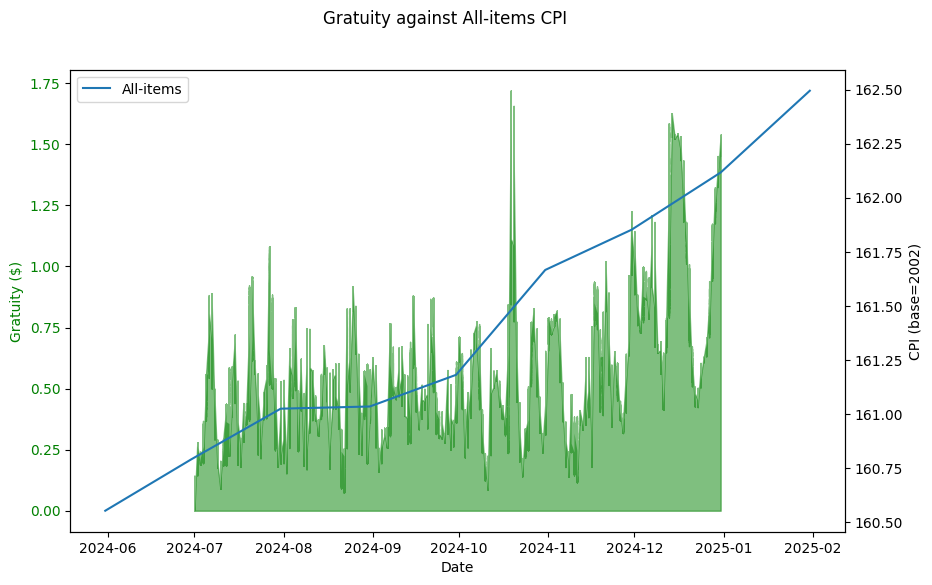

In [572]:
y1 = aux_bills_restaurant_data['bill_total_gratuity']
y1_label = 'Gratuity ($)'
title = 'Gratuity against All-items CPI'

plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

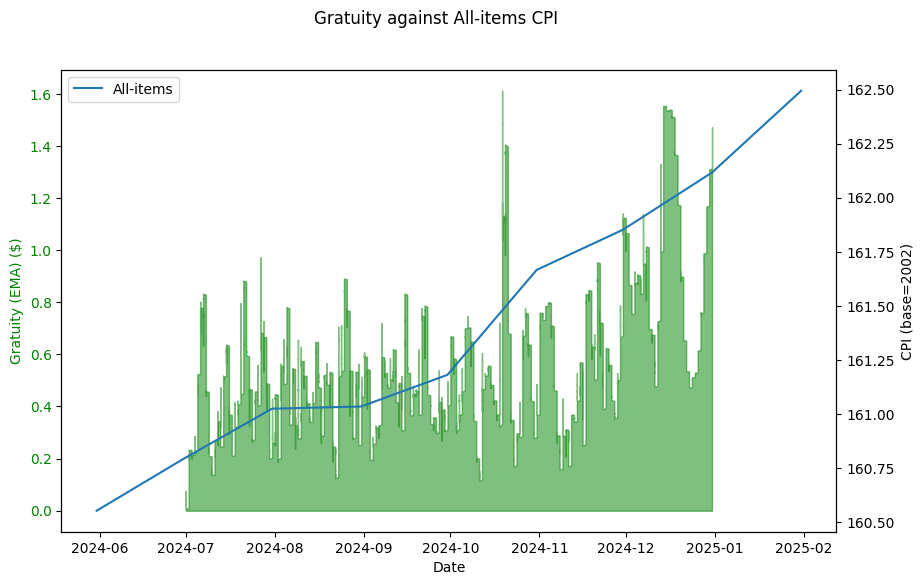

In [573]:
gratuity_ema = ema(aux_bills_restaurant_data['bill_total_gratuity'])
y1 = gratuity_ema
y1_label = 'Gratuity (EMA) ($)'
plot_twin_time_series(x, x_label, y1, y1_label, y2, y2_label, y2_axis_label, title)

## Other metrics Calculations

### Tips proportions

Text(0.5, 1.0, 'Sales Tip Proportion vs CPI')

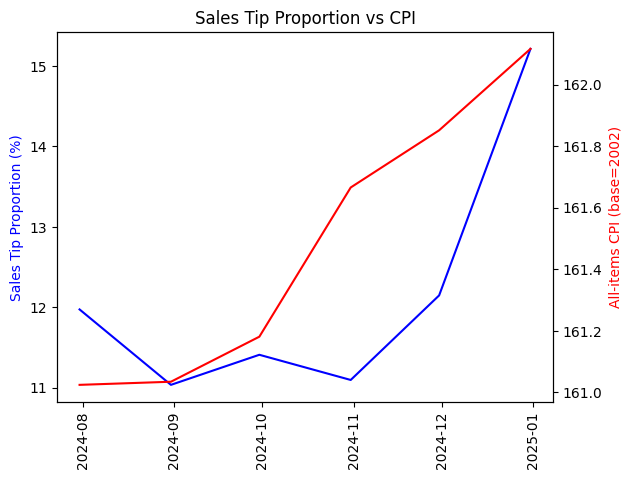

In [592]:
monthly_tips_ema = tips_ema.resample('ME').mean()
monthly_sales_ema = sales_ema.resample('ME').mean()

sales_tip_proportion = monthly_tips_ema / monthly_sales_ema * 100

y_lab = 'Sales Tip Proportion (%)'


fig,ax1 = plt.subplots()
x = all_items_calc.index
ax1.plot(x, sales_tip_proportion, label='sales_tip_proportion', color='b')
ax1.set_ylabel(y_lab, color='b')
plt.xticks(rotation=90)

ax2 = ax1.twinx()
ax2.plot(x, all_items_calc, label='All-items CPI', color='r')
ax2.set_ylabel('All-items CPI (base=2002)', color='r')
plt.title('Sales Tip Proportion vs CPI')

Here, we can immediately see a negative correlaton between the price index and the sales-to-tip proportion. This correlation continues until December where the sales-tip proportion drastically increases since it's the winter holidays, and also there's a tax break, so everyone is going out to eat.



# In Conclusion

Notes:
- Should have atleast 3-5 years worth data to deseasonalize the revenue data, in order decompose the data to see the underlying trend, rather than the seasonal highs and lows
- Additionally, the recent winter 2024 holiday tax break heavily encouraged people to eat out at restaurants, which is why it was hard to tell if an increase in sales was due to this irregular event, the fact it was a seasonal holiday, or it was a genuine increase.

Observations:
- Sales revenue increased despite the price indices of private transportation (excluding gas), gasoline, and energy increasing.
    - This is likely due to the winter holiday tax break, which greatly boosted restaurants sales even when overall inflation is increasing.
- Around 33\% of the average monthly sales revenue is due to inflation (based on 2002 prices)
- Sales revenue's growth was negative from september to mid october, and sky rocketed in growth starting in December, to more than 20% by the end of the month!
- Sales-to-tips proportion is heavily affected by inflation, however, when it came around the holidays, the proportion dramatically increased.

In terms of provinces:
- Ontario benefited the most from the winter holiday tax break, seeing a big increase during December (not deseasonalized, make sure to deseasonalize to see the actual amount)
- Quebec barely budged, staying relatively stagnant, despite it being both the holidays and also having the winter tax break
- Western Canadian restaurants generally appeared to be doing really well overall